In [1]:
import numpy as np
import pandas as pd
from scipy.stats import norm
from skimage import measure
from skimage.transform import resize,rotate
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances
import scipy
from astropy.coordinates import SkyCoord 
from astropy import units as u

In [2]:
prng=np.random.RandomState(0)

# Data preparation

## Image functions

In [3]:
from mpl_toolkits.axes_grid1 import ImageGrid
import skimage.transform as skimg

def make_image(I,figsize,title,D,F=None,pad=False,labels=None):
    L=[]
    for i in I:L.append(D[i])
    diff=figsize[0]*figsize[1]-len(L)
    if pad and diff>0:
        for i in np.arange(0,diff):
            L.append(np.zeros((31,31)))
    fig=plt.figure(figsize=figsize)
    plt.title(title,fontsize=12)
    plt.axis("off")
    grid=ImageGrid(fig,111,nrows_ncols=figsize,axes_pad=0)
    if labels is None: labels=[None]*len(L)
    assert(len(labels)==len(L))
    last_label=None
    for l,ax,im in zip(labels,grid,L):
        if F: im=F(im)
        im-=im.min()
        im/=im.max()
        ax.set_axis_off()
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(im,cmap="gray",vmin=0)
        if l and l!=last_label: ax.text(0,5,l,bbox=dict(facecolor='white'))
        last_label=l
    plt.tight_layout()
    return plt

## Process functions

In [4]:
def reduce_noise(r,p=.9):
    q=np.quantile(r[r>0],[.25,.5,.75])
    mu=q[1];std=(q[2]-q[0])/1.349
    sea=(norm.cdf(r,mu,std)<p)
    return np.where(sea,0,r)

def rotate_major_to_xaxis(r):
    a=np.argwhere(r>0)
    if len(a)<3: return r
    cov=np.cov(a,rowvar=False)
    eig,vec=np.linalg.eig(cov)
    v1,v0=vec[np.argsort(eig)]
    theta=np.degrees(np.arctan(v0[1]/v0[0]))
    return rotate(r,theta,preserve_range=True)

def flip(r):
    n=int(len(r)/2)
    r=r.copy()
    r[r==0]=np.nan
    if np.nanmean(r[:,0:n])>np.nanmean(r[:,-n:]): r=np.flip(r,axis=1)
    if np.nanmean(r[0:n,:])<np.nanmean(r[-n:,:]): r=np.flip(r,axis=0)
    r[np.isnan(r)]=0
    return r

## Create catalogue and pairwise dissimilarity matrix

In [5]:
# Sources
D=np.load("data/data.npy")
X=D.copy()
C=pd.read_csv("data/used.csv")

for i in range(0,X.shape[0]):
    X[i]=reduce_noise(X[i],.9)
    X[i]=rotate_major_to_xaxis(X[i])
    X[i]=flip(X[i])
    X[i]-=X[i].min()
    X[i]/=X[i].max()

X=X.reshape((X.shape[0],X.shape[1]*X.shape[2]))
idx=np.arange(0,len(X))
i=np.argwhere(np.isnan(X.sum(axis=1)))
X=X[~np.isin(idx,i)]
D=D[~np.isin(idx,i)]
C=C[~C.index.isin(i.flatten())].reset_index(drop=True)
inc=(C.z_phot.values<=3) & (C.snr>=20) & (C.m>=1e8)
D=D[inc]
X=X[inc]
C=C[inc].reset_index(drop=True)
C=pd.merge(C,pd.read_csv("data/sfr.csv"), on="seq")

# Approximate X to reduce dimensionality.
N_components=40
pca = PCA(N_components).fit(X)
X = pca.transform(X)

dist_sim=euclidean_distances(X,squared=True).astype("float64")

rest_frame=[
    "UMag_6a_tau","BMag_6a_tau","VMag_6a_tau",
    "RMag_6a_tau","IMag_6a_tau","JMag_6a_tau",
    "KMag_6a_tau"
]

S=C[rest_frame].values
dist_sed=euclidean_distances(S, squared=True).astype("float64")


C["u-r"] = C.UMag_6a_tau-C.RMag_6a_tau
C.z_best = np.where(C.z_best < 0, 0, C.z_best)

print(len(dist_sim),(C.z_spec>0).sum())

7757 2256


# SED/Morphology space fraction

100000000 avg 0.3705408515535098 N 7757
1000000000 avg 0.3773987206823028 N 4579
10000000000 avg 0.3436307251908397 N 1222


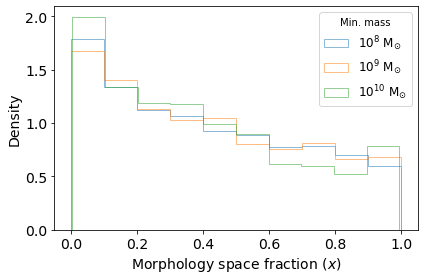

In [6]:
def get_fraction(mass_q=0, z_lim=0.15, spc1=dist_sed, spc2=dist_sim):
    idx = np.arange(0, len(dist_sim))[C.m >= mass_q]
    spc1 = spc1[idx][:,idx].copy()
    np.fill_diagonal(spc1, 9999999999999)
    spc2 = spc2[idx][:,idx]
    a = []
    I = np.arange(0, len(spc1))
    for i in I:
        Z = C.z_best[idx]
        z = C.z_best.values[idx[i]]
        x = I[(Z >= (z - z_lim)) & (Z <= (z + z_lim))]
        n = np.argmin(spc1[i, x])
        v = np.argsort(spc2[i, x])
        a.append(np.argmax(v == n) / len(v))
    return np.array(a)
lbls = ["$10^8$", "$10^9$", "$10^{10}$"]
for i, q in enumerate([10**8, 10**9, 10**10]):
    f = get_fraction(q)
    print(q, "avg", np.median(f), "N", len(f))
    plt.hist(f, histtype="step", density=True, label=lbls[i] + " ${\\rm M_{\\odot}}$", alpha=0.5)
plt.legend(title="Min. mass", fontsize=12)
plt.xlabel("Morphology space fraction ($x$)", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.tight_layout()
plt.savefig("img/frac-dist.pdf")

In [7]:
C["f"] = get_fraction(0)
C["g"] = C.f < .1
C["f2"] = get_fraction(0, spc1=dist_sim, spc2=dist_sed)
C["g2"] = C.f2 < .1
print("x<.1", C.g.sum(), C.g.sum() / len(C))

x<.1 1389 0.17906407116153153


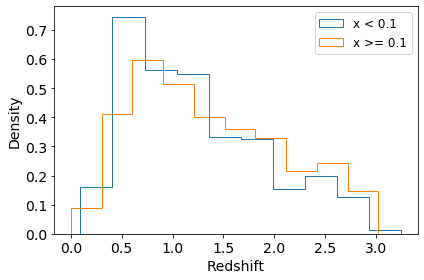

In [62]:
plt.hist(C.z_best[C.g], density=True, histtype="step", label="x < 0.1")
plt.hist(C.z_best[~C.g], density=True, histtype="step", label="x >= 0.1")
plt.legend(fontsize=12)
plt.xlabel("Redshift", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.tight_layout()
plt.savefig("img/z-group-dist.pdf")

diff 1.29E+09
3.16E+09


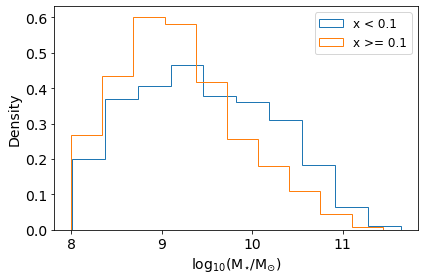

In [63]:
plt.hist(np.log10(C.m[C.g]), density=True, histtype="step", label="x < 0.1")
plt.hist(np.log10(C.m[~C.g]), density=True, histtype="step", label="x >= 0.1")
plt.legend(fontsize=12)
plt.xlabel("$\\rm{log_{10}}(M_{\\star}/\\rm{M_{\\odot}})$", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.tight_layout()
plt.savefig("img/mass-group-dist.pdf")
print("diff", '%.2E' % (np.median(C.m[C.g]) - np.median(C.m[~C.g])))
print('%.2E' % (10**9.5))

/home/nodeuser/.local/lib/python3.8/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


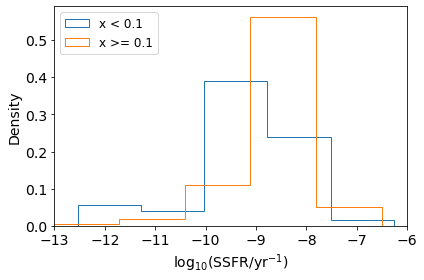

In [66]:
ssfr1 = C.SFR_6a_tau[C.g] / C.m[C.g]
ssfr1 = np.where(ssfr1 == 0, 0 , np.log10(ssfr1))
ssfr2 = C.SFR_6a_tau[~C.g] / C.m[~C.g]
ssfr2 = np.where(ssfr2 == 0, 0 , np.log10(ssfr2))



plt.hist(ssfr1, density=True, histtype="step", label="x < 0.1")
plt.hist(ssfr2, density=True, histtype="step", label="x >= 0.1")
plt.legend(fontsize=12, loc="upper left")
plt.xlabel("$\\rm{log_{10}}(SSFR/yr^{-1})$", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.xlim((-13,-6))
plt.tight_layout()
plt.savefig("img/sfr-group-dist.pdf")

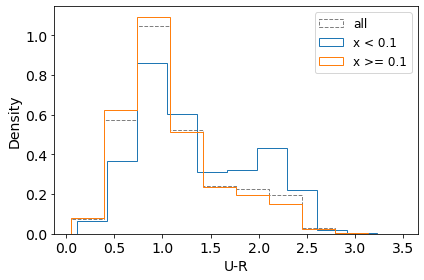

In [65]:
col = C.UMag_6a_tau-C.RMag_6a_tau
plt.hist(col, density=True, histtype="step", color="gray", ls="--", label="all")
plt.hist(col[C.g], density=True, histtype="step", label="x < 0.1")
plt.hist(col[~C.g], density=True, histtype="step", label="x >= 0.1")
plt.legend(fontsize=12)
plt.xlabel("U-R", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.tight_layout()
plt.savefig("img/col-group-dist.pdf")

In [12]:
from sklearn.cluster import AffinityPropagation as AP
M=AP(damping=.99, max_iter=50000, random_state=prng).fit(X)
print("No. of clusters",M.labels_.max()+1)
idx, cnt = np.unique(M.labels_, return_counts=True)
res = dict(zip(np.argsort(-cnt), idx))
C["part"] = list(map(lambda x: res[x], M.labels_))
_, cnt = np.unique(C.part, return_counts=True)
cum = np.cumsum(cnt) / cnt.sum()
print(cum[24], cnt[24])

No. of clusters 72
0.885393837823901 53


/tmp/ipykernel_37830/900635286.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


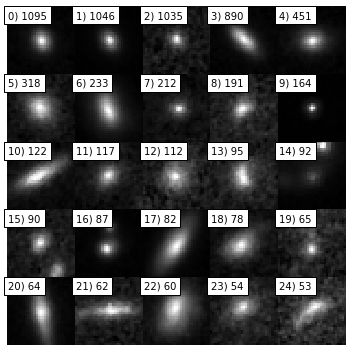

In [13]:
_, cnt = np.unique(M.labels_, return_counts=True)
ind = np.argsort(-cnt)[:25]
cnt = cnt[np.argsort(-cnt)]
ex = M.cluster_centers_indices_[ind]
lbl = map(lambda x: "%d) %d" % x, zip(range(0,25), cnt[:25]))
make_image(ex, (5,5), None, D, labels=list(lbl))
plt.savefig("img/exemplars.png")

In [29]:
import statsmodels.api as sm
from tabulate import tabulate
C["c2"] = C["u-r"] > 2
tab = sm.stats.Table.from_data(C[["part","g"]])
tbl = tab.resid_pearson.reset_index(drop=True).round(2)[:25]
grp = C[C.g].groupby("part").agg({
    "g":"sum", 
    "z_best": "median", 
    "m": "median",
    "c2": "sum"}
)[:25]
tbl["sample"] = grp.g.values
tbl["z"] = np.round(grp.z_best.values, 2)
tbl["m"] = np.round(grp.m.values, 2)
tbl["c2"] = np.round(grp["c2"].values, 2)
with open("prominence.latex", "w") as fn:
    fn.write(tabulate(tbl, 
        headers=["Part.", "x>=.1", "x<.1", "#", "z", "mass", "u-r>2"],
        tablefmt="latex"))
tbl

g,False,True,sample,z,m,c2
0,0.86,-1.83,171,1.02,1.640000e+09,40
1,-1.30,2.78,226,1.16,7.575000e+09,103
2,0.72,-1.53,165,1.41,1.040000e+09,35
3,0.73,-1.57,140,0.93,1.705000e+09,9
4,0.52,-1.11,71,1.03,6.640000e+09,21
5,-0.06,0.12,58,0.86,5.075000e+09,3
6,-0.37,0.80,47,0.93,4.680000e+09,5
7,0.69,-1.47,29,1.47,1.330000e+09,7
8,0.74,-1.59,25,1.57,9.740000e+08,1
9,-2.55,5.45,59,0.50,1.280000e+09,31


100000000 avg 0.34947963869339976 N 7757
1000000000 avg 0.38910230305996163 N 4579
10000000000 avg 0.43132111508211757 N 1222


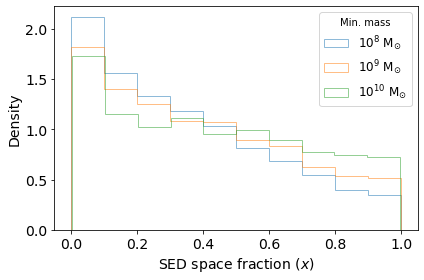

In [16]:
lbls = ["$10^8$", "$10^9$", "$10^{10}$"]
for i, q in enumerate([10**8, 10**9, 10**10]):
    f = get_fraction(q, spc1=dist_sim, spc2=dist_sed)
    print(q, "avg", np.mean(f), "N", len(f))
    plt.hist(f, histtype="step", density=True, label=lbls[i] + " ${\\rm M_{\\odot}}$", alpha=0.5)
plt.legend(title="Min. mass", fontsize=12)
plt.xlabel("SED space fraction ($x$)", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.tight_layout()
plt.savefig("img/frac-dist-appear.pdf")

0.3705408515535098 0.2994542974079127 1389 1640 0.17906407116153153 0.21142194147221863 393


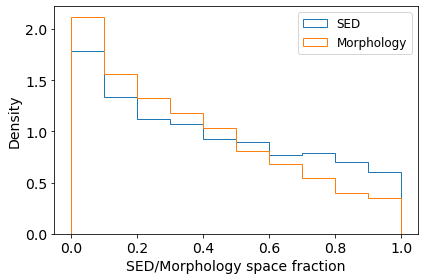

In [17]:
plt.hist(C.f, density=True, histtype="step", label="SED")
plt.hist(C.f2, density=True, histtype="step", label="Morphology")
plt.legend(fontsize=12)
plt.xlabel("SED/Morphology space fraction", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.tight_layout()
plt.savefig("img/sed-vs-appear.pdf")
print(np.median(C.f), np.median(C.f2), C.g.sum(), C.g2.sum(), C.g.sum()/len(C), C.g2.sum()/len(C), C.both.sum())

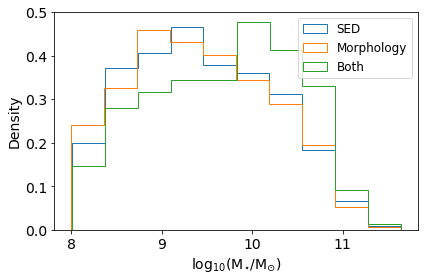

In [59]:
plt.hist(np.log10(C.m[C.g]), density=True, histtype="step", label="SED")
plt.hist(np.log10(C.m[C.g2]), density=True, histtype="step", label="Morphology")
plt.hist(np.log10(C.m[C.both]), density=True, histtype="step", label="Both")
plt.legend(fontsize=12)
plt.xlabel("$\\rm{log_{10}}(M_{\\star}/\\rm{M_{\\odot}})$", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.tight_layout()
plt.savefig("img/sed-appear-both-mass.pdf")

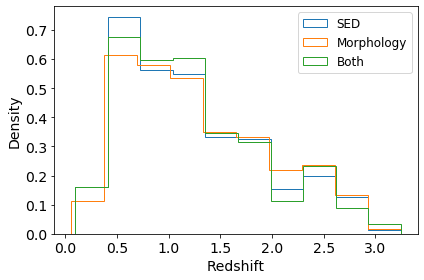

In [19]:
plt.hist(C.z_best[C.g], density=True, histtype="step", label="SED")
plt.hist(C.z_best[C.g2], density=True, histtype="step", label="Morphology")
plt.hist(C.z_best[C.both], density=True, histtype="step", label="Both")
plt.legend(fontsize=12)
plt.xlabel("Redshift", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.tight_layout()
plt.savefig("img/sed-appear-both-z.pdf")

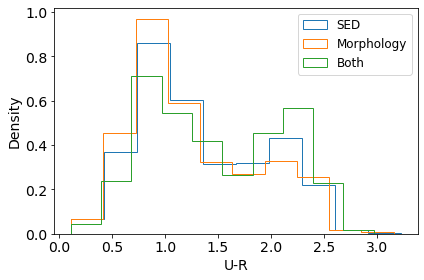

In [20]:
plt.hist(C["u-r"][C.g], density=True, histtype="step", label="SED")
plt.hist(C["u-r"][C.g2], density=True, histtype="step", label="Morphology")
plt.hist(C["u-r"][C.both], density=True, histtype="step", label="Both")
plt.legend(loc="upper right", fontsize=12)
plt.xlabel("U-R", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.tight_layout()
plt.savefig("img/sed-appear-both-colour.pdf")

Cross-validated balanced accuracy 0.6449029680365297
Balanced accuracy 0.6307850973314426


/tmp/ipykernel_37830/900635286.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


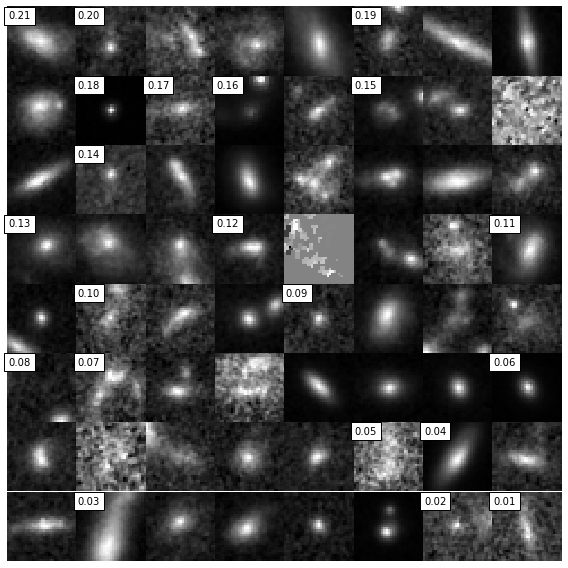

In [21]:
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.linear_model import RidgeClassifier, LogisticRegression
from sklearn.inspection import permutation_importance

x, y = dist_sim[:,M.cluster_centers_indices_], C.both

m = RidgeClassifier(class_weight="balanced", max_iter=1000, random_state=prng)
mu = np.mean(cross_val_score(m, x, y, cv=100, scoring="balanced_accuracy"))
print("Cross-validated balanced accuracy", mu)

m.fit(x, y)
print("Balanced accuracy", m.score(x, y))

r = permutation_importance(m, x, y, n_repeats=100, scoring="recall")
srt = np.argsort(-r.importances_mean)
ex = M.cluster_centers_indices_[srt]
imp = r.importances_mean[srt]
lbl = list(map(lambda x: "%.2f" % x, imp))
n = int(len(ex)**.5)
make_image(ex, (n, n), None, D, labels=lbl)
plt.savefig("img/ridge-regression.pdf")

In [22]:
n = ["U", "B", "V", "R", "I", "J", "K"]
x = {}
for a in np.arange(0, len(n)):
    for b in np.arange(a+1, len(n)):
        x["%s-%s" % (n[a], n[b])] = (S[:,a] - S[:,b])
x2 = pd.DataFrame(x)
x = S

In [23]:
def find_results(x, m):
    a = []
    for j in np.unique(C.part):
        best_res, best = None, None
        for z in np.arange(0.25,2.76,.01):
            z_sta, z_sto = z-.25, z+.25
            cond = (C.z_best >= z_sta) & (C.z_best <= z_sto)
            y = (C.part == j)[cond]
            if y.sum()<50: continue
            cv = cross_validate(
                m, x[cond], y, cv=10, 
                scoring=["recall", "balanced_accuracy"])
            res = (
                j, 
                "%.2f-%.2f" % (z_sta, z_sto),
                y.sum(),
                np.mean(cv['test_recall']),
                np.mean(cv['test_balanced_accuracy'])
            )
            if best is None or best < res[4]: 
                best = res[4]
                best_res = res
        if best_res is not None: a.append(best_res)
    return pd.DataFrame(a, columns=["part", "z", "sample", "recall", "accuracy"]).round(2)

In [24]:
from sklearn.tree import DecisionTreeClassifier

m = DecisionTreeClassifier(class_weight="balanced", random_state=prng, max_depth=6)
df = find_results(x2 ,m)
with open("col-dec-regression.latex", "w") as fn:
    fn.write(tabulate(df.reset_index(drop=True), 
        headers=["Part.", "Best z", "#", "Coverage", "Accuracy"],
        tablefmt="latex", showindex=False))
df

,part,z,sample,recall,accuracy
0,0,0.94-1.44,278,0.60,0.61
1,1,0.53-1.03,336,0.40,0.64
2,2,1.91-2.41,190,0.47,0.62
3,3,0.78-1.28,239,0.67,0.59
4,4,0.85-1.35,133,0.55,0.62
5,5,0.05-0.55,73,0.62,0.61
6,6,0.80-1.30,55,0.71,0.67
7,7,2.24-2.74,50,0.34,0.56
8,8,0.59-1.09,50,0.76,0.62
9,9,0.23-0.73,96,0.91,0.92


In [25]:
m = RidgeClassifier(class_weight="balanced", random_state=prng, max_iter=1000)
df = find_results(x ,m)
with open("col-regression.latex", "w") as fn:
    fn.write(tabulate(df.reset_index(drop=True), 
        headers=["Part.", "Best z", "#", "Coverage", "Accuracy"],
        tablefmt="latex", showindex=False))
df

,part,z,sample,recall,accuracy
0,0,0.00-0.50,60,0.62,0.61
1,1,0.58-1.08,327,0.54,0.64
2,2,0.16-0.66,73,0.82,0.73
3,3,0.05-0.55,109,0.70,0.62
4,4,0.87-1.37,134,0.68,0.68
5,5,0.79-1.29,92,0.74,0.71
6,6,0.71-1.21,63,0.76,0.73
7,7,1.89-2.39,50,0.46,0.53
8,8,0.57-1.07,50,0.80,0.68
9,9,0.03-0.53,78,0.98,0.90


/tmp/ipykernel_37830/900635286.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_37830/900635286.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig=plt.figure(figsize=figsize)
/tmp/ipykernel_37830/900635286.py:28: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


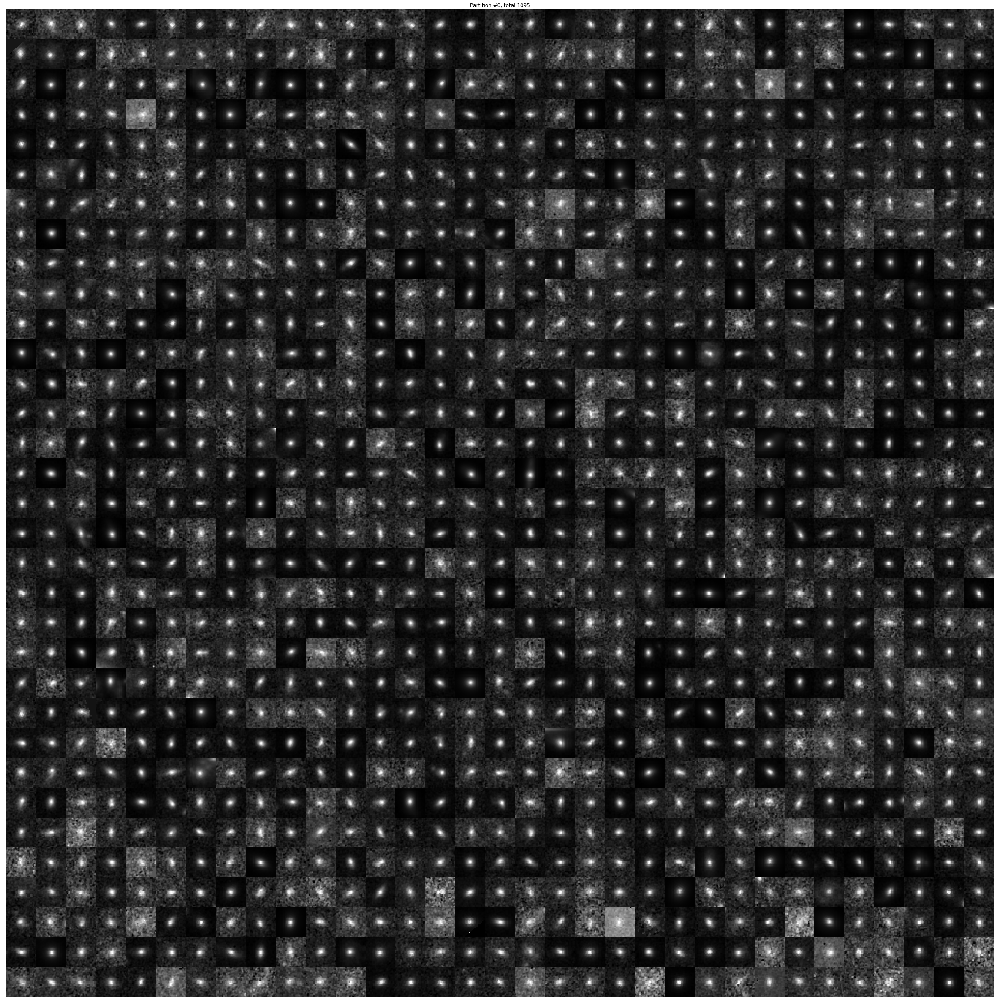

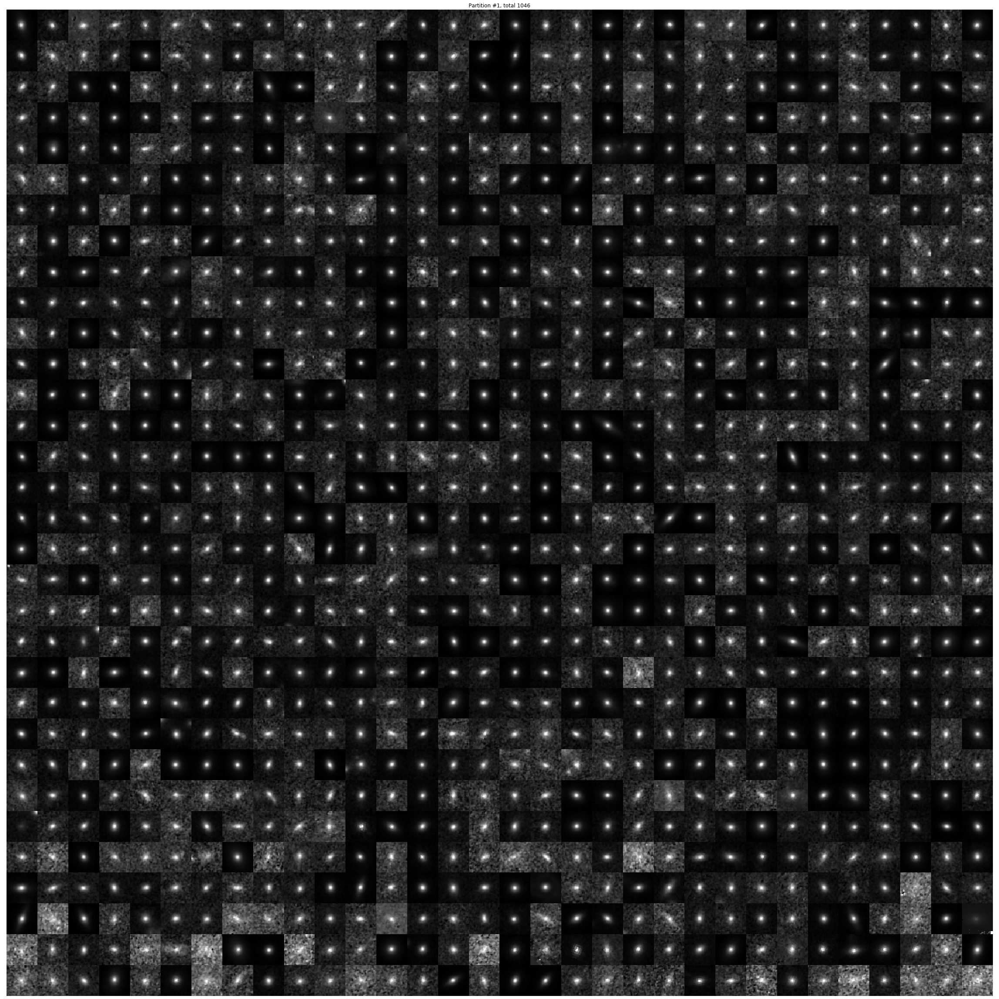

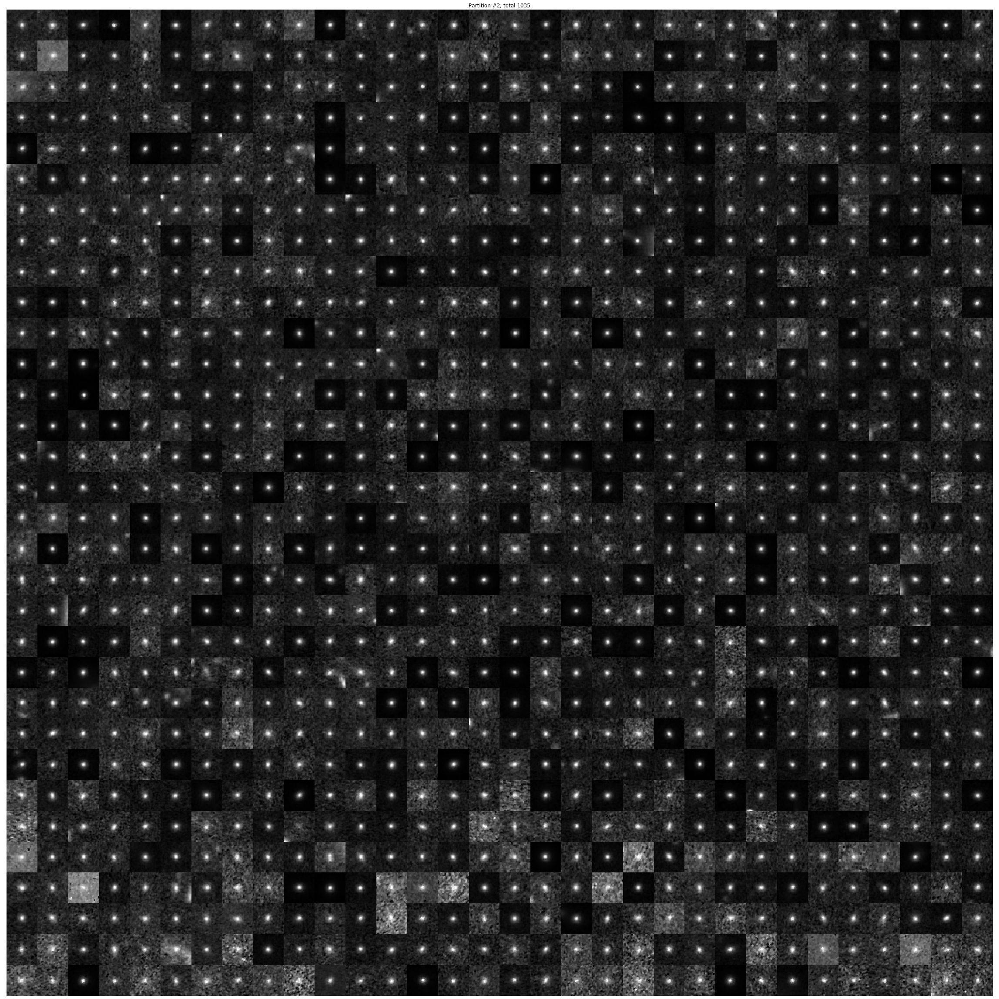

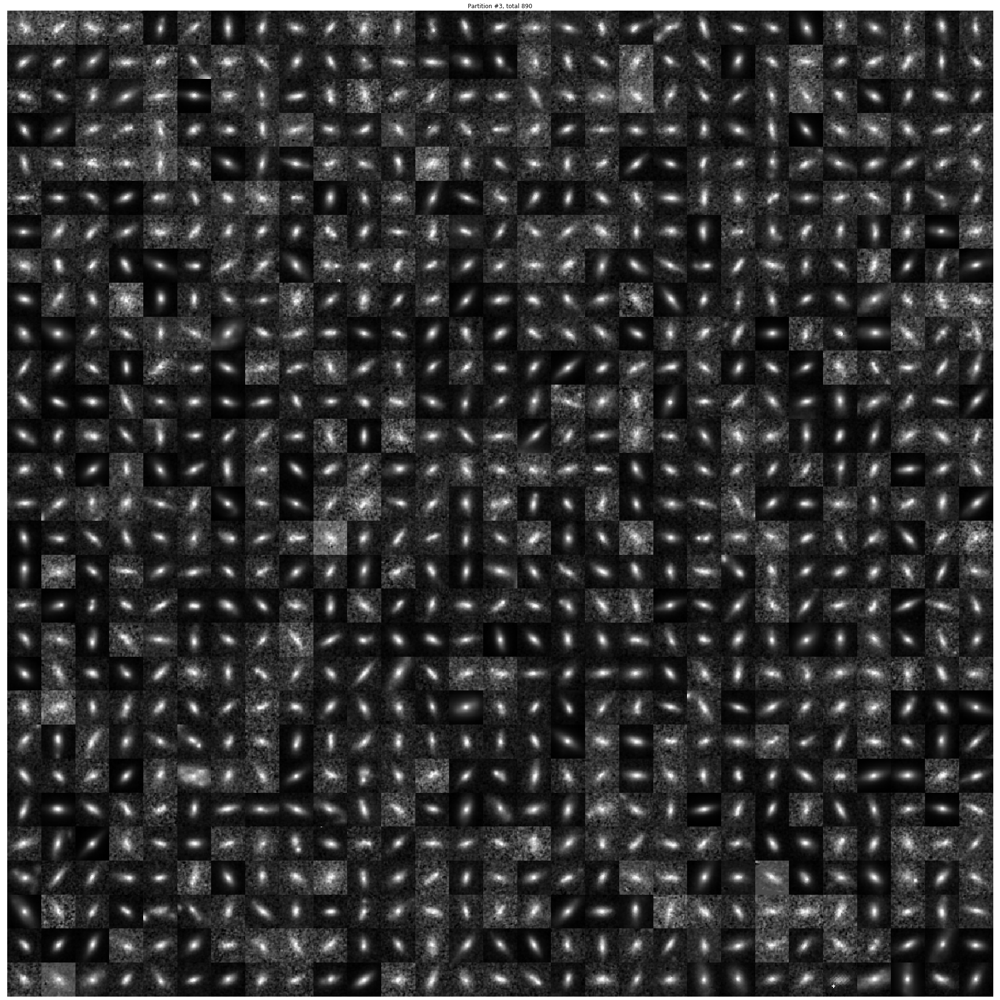

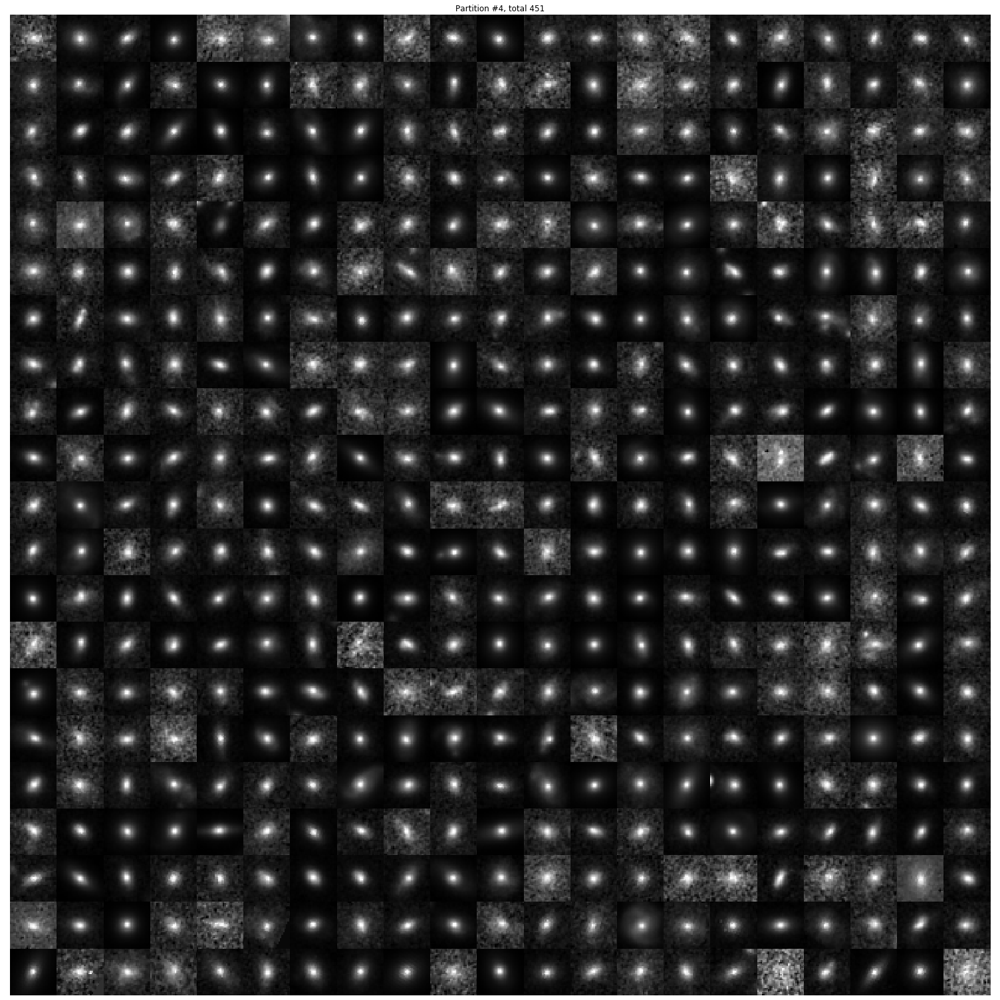

...

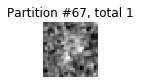

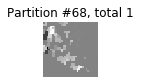

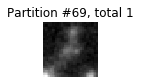

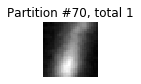

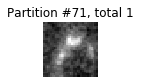

In [27]:
idx = np.arange(0, len(C))
for p in np.unique(C.part):
    i = idx[C.part == p]
    n = int(len(i) ** .5)
    make_image(i, (n, n), "Partition #%d, total %d" % (p, len(i)), D)
    plt.savefig("supplement/partition-%d.png" % p)